# Analysis of retweets 
In this notebook, we will look into how the politicians in our dataset retweet each other and the media. 
**Definition of a retweet: **  A retweet is when someone republishes or forwards a post to their own Twitter followers.
Retweets are typically credited to their original authors, incentivizing users to create shareable content that expands their Twitter footprint. 
[https://www.bigcommerce.com/ecommerce-answers/what-is-a-retweet/]

Our hypothesis is that people and particular American politicians retweet tweet that confirms their world view. By analyzing the way the politician's retweet we hope to reject or confirm this hypothesis. 


This notebook is composed of three subparts.

1. The first part is devoted to loading the data and creating the retweet graph.

2. The second a part devoted to how the politicians retweet each other internally.

3. The third part is devoted to how the politicians retweet the media. Here 16 prominent American new media Twitter profiles were chosen. The relationship between politicians and media was modelled as a bipartiate graph. 


## Package import

In [2]:
import pandas as pd
import numpy as np

import tweepy
import pickle
import pandas as pd
import numpy as np
import powerlaw
import networkx as nx 

from tqdm import trange, tqdm
from collections import Counter
from networkx.algorithms import bipartite
from fa2 import ForceAtlas2

from matplotlib import cm
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import chart_studio.plotly as py
import chart_studio.tools as tls
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

init_notebook_mode(connected=True)
%matplotlib inline

# Part 1: Data import and processing
In the cells below are the Congress Twitter data loaded, a data set describing the Twitter handles of the American politicians as well as a dataset describing 16 prominent American news media. 
The data frame describing the media is displayed below.

In [3]:
# Import cleaned and processed tweets
df_congress_tweets = pd.read_pickle('../Data/Processed/congress_cleaned_processed.pkl')

# Import media, twitter_handles and defining politician names
medias = pd.read_table('../Data/Raw/LargestMedia.csv', sep=';')
twitter_handles = pd.read_table('../Data/Processed/Twitter_Handles_updated.csv', sep = ',')
politician_names = twitter_handles['Name']
medias

,Media,Type,Twitter name,twitter_display_name
0,ABC News,Television,ABC,ABC News
1,CBS News,"Television, radio",CBSNews,CBS News
2,CNN,Television,CNN,CNN
3,Fox News,Television,FoxNews,Fox News
4,MSNBC,Television,MSNBC,MSNBC
5,NBC News,Television,NBCNews,NBC News
6,Bloomberg,Online,business,Bloomberg
7,The New York Times,Newspaper,nytimes,The New York Times
8,USA Today Politics,Newspaper,usatodayDC,USA TODAY Politics
9,Breitbart News,Online,BreitbartNews,Breitbart News


In [4]:
# Reconstruct media dataframe such that it can be concatenated with the dataframe containing the twitter handles
medias['State'] = None
medias['Party'] = None
medias['Type'] = 'Media'
medias.rename(columns={'Twitter name': 'Twitter', 'Media': 'Name'}, inplace=True)

In [5]:
# The merged dataframe
Data_Full = pd.concat([twitter_handles, medias])
Data_Full.head()

,Twitter,State,Party,Type,Name,twitter_display_name
0,JeffFlake,AZ,Republican,Senator,Jeff Flake,Jeff Flake
1,SenJonKyl,AZ,Republican,Senator,Jon Kyl,U.S. Senator Jon Kyl
2,reppeteaguilar,CA,Democrat,Representative,Peter Aguilar,Rep. Pete Aguilar
3,repcardenas,CA,Democrat,Representative,Tony Cardenas,Rep. Tony Cárdenas
4,DarrellIssa,CA,Republican,Representative,Darrell Issa,Darrell Issa


We are only interested in the retweets made by the politicians - thus a new dataframe containing only politicians in the congress is created.  

In [6]:
# Filter
df_retweets = df_congress_tweets[df_congress_tweets['retweet'].isin(Data_Full.Twitter)]

We want to investigate who retweets whom and in order to get an overview, an adjacency matrix containing all politicians and media is created. Each row is a politician/media and the same goes for each column. 
First, an adjacency matrix with zeros is initialized where rows and columns are defined as the names from the complete data frame. 

In [7]:
# Initialize data frame
retweets_pd = pd.DataFrame(data = 0, index = Data_Full['Name'], columns = Data_Full['Name'])

It is interesting to investigate how many times politicians have retweeted another politician or media which is why the adjacency matrix is created as a weighted matrix. Iterating through the complete data frame `Data_Full` each index between a politician and another politician or media is incremented by 1 for every time there appears a retweet. 

In [8]:
# Populate dataframe
for idx, retweet in tqdm(df_retweets.iterrows(), total=len(df_retweets)):
    
    retweeter = retweet['user_name']
    original_poster = retweet['retweet'] 

    retweeter_name = Data_Full[Data_Full['twitter_display_name'] == retweeter]['Name'].values[0]
    original_poster_name = Data_Full[Data_Full['Twitter'] == original_poster]['Name'].values[0]

    retweets_pd.loc[retweeter_name, original_poster_name] += 1

100%|██████████| 72984/72984 [01:49<00:00, 667.45it/s]


# Part 2: Who Retweets Whom
In this part, it will be investigated which American politicians retweet whom both inside and across parties.
Thus the news media will not yet be considered. 
The graph is created by considering who retweets whom. If person *a* retweet the tweet person *b* created a directed link pointing from $a$ to $b$ is created. Furthermore, if there are multiple links the link will be weighted accordingly. 

In the cell below is the re-tweet graph constructed and the *Giant Connected Component* is extracted.

In [9]:
# From the retweets graph discard the news media
df_poltician_retweets = retweets_pd.loc[politician_names, politician_names]
df_twitter_handles = pd.read_csv('../Data/Processed/Twitter_Handles_updated.csv', index_col=0).set_index('Name')


# Create graph
G = nx.from_numpy_matrix(df_poltician_retweets.values, create_using=nx.DiGraph())
# Because we use numpy, labels need to be reset
label_mapping = {idx: val for idx, val in enumerate(df_poltician_retweets.columns)}
G = nx.relabel_nodes(G, label_mapping)

# Add attributes such as name, state party to the nodes
for node in G.nodes:
    G.nodes[node].update(df_poltician_retweets.loc[node])
    G.nodes[node].update(df_twitter_handles.loc[node].to_dict())

# Get isolates from undirected graph by examining GCC
UG = G.to_undirected()
UG_GCC = UG.subgraph(sorted(nx.connected_components(UG), key = len, reverse = True)[0]).copy()
nodes_to_remove = [node for node in UG if node not in UG_GCC]
UG.remove_nodes_from(nodes_to_remove)

# Remove isolates from directed graph
G.remove_nodes_from(nodes_to_remove)

# Show how many are removed
print(f"{len(nodes_to_remove)} nodes removed as they are not contained in the giant connected component.")

28 nodes removed as they are not contained in the giant connected component.


## Statistics on re-tweet graph
The statistics have been made on the directed graph, `G`, where isolates have been removed.

In [10]:
# Nodes
print(f'The graph has {len(G.nodes)} nodes in total')

# Edges
print(f'There are a total of {len(G.edges)} edges in the data set.')

The graph has 590 nodes in total
There are a total of 18852 edges in the data set.


## Correcting for "self-retweet"

It turns out a few politicians are very fond of retweeting themselves. 
That could be because they posted a prediction that turned out to be true or whatnot.
Below is a histogram available that shows the fraction of retweet that is tweet the politicians wrote themselves. 
As can be seen, most politicians only retweet themselves modestly, however, a few are particularly happy about the tweet they wrote themselves.

In [11]:
tmp = df_poltician_retweets.loc[list(G.nodes), list(G.nodes)]
df_retweet_to_self = (pd.DataFrame(index = tmp.columns)
    .assign(retweets = tmp.sum(axis=1).values)
    .assign(to_self = np.diagonal(tmp.values)) 
)   
df_retweet_to_self['fraction'] = df_retweet_to_self['to_self']/df_retweet_to_self['retweets']

fig = px.histogram(
    df_retweet_to_self,
    x = 'fraction',
    labels={
        "fraction": "Fraction of retweets that are retweet of self-written tweets"
    },
)
fig.write_html(
    file = "../web_app/plotly_files/retweet_fracton.html", 
    full_html = False,
    include_plotlyjs='cdn'
)
fig

Listed below are the 5 politicians that retweet themself the most as a fraction of all their tweets. Jim Cooper is the winner of retweeting himself with 91.2 % off all retweets being his own tweets.

In [12]:
df_retweet_to_self.sort_values(by='fraction', ascending = False).iloc[0:5]

,retweets,to_self,fraction
Name,,,
Jim Cooper,426,391,0.917840
Dina Titus,427,387,0.906323
Steve Cohen,614,513,0.835505
Ami Bera,87,71,0.816092
Kyrsten Sinema,114,92,0.807018


![alt text](../figures/jim_cooper.png "Title")

Though the politicians, that retweet themselves a lot, seem to have a high retweet count, we do not think a retweet is earned if the retweet originates from the person's own tweets, as we want to explore how the politician re-tweet each other.
Thus, these intern retweets are substracted from the number of retweets received.

In [13]:
df_sum_tweets = (pd.DataFrame(index = df_poltician_retweets.loc[list(G.nodes), list(G.nodes)].columns)
    .assign(in_degree = [in_degree for name, in_degree in G.in_degree(weight='weight')])     # Note the weigted degree
    .assign(out_degree = [out_degree for name, out_degree in G.out_degree(weight='weight')]) # Note the weigted degree
    .assign(Party = list(nx.get_node_attributes(UG, 'Party').values()))
    .assign(Type = list(nx.get_node_attributes(UG, 'Type').values()))
    .assign(State = list(nx.get_node_attributes(UG, 'State').values()))
)
# Remove re-tweets posted by the politicians him/her self.
df_sum_tweets['in_degree'] = df_sum_tweets['in_degree'] - df_retweet_to_self['to_self']

## Degree Distribution
After removing the retweets of politicians that retweet themselves we will look into the degree distribution. Here the weighted degree distribution is considered. That is if a politician has retweeted another politician e.g. 10 times the weight on the edge is 10 rather than 1 if a politician had only retweeted the other once. It is a more fair measure to consider weighted degree distribution in this context.

Below is the in - and out-degree distribution plotted as a histogram as well as in a log-log scatterplot.

In [14]:
fig = make_subplots(
    rows=1, 
    cols=2, 
    shared_yaxes=True,
    subplot_titles=("In degree", "Out degree")
)

trace_in = go.Histogram(
    x=df_sum_tweets['in_degree'], 
    name='In-degree',
)

trace_out = go.Histogram(x=df_sum_tweets['out_degree'], name='Out-degree')

fig.append_trace(trace_in, 1, 1)
fig.append_trace(trace_out, 1, 2)
fig.update_layout(
    margin=dict(b=5,l=5,r=5,t=40), 
    showlegend=False
)
fig.update_xaxes(title_text='k')
fig.update_yaxes(title_text='Count', row=1, col=1)
fig.write_html(
    file = "../web_app/plotly_files/degree_distribution_1.html", 
    full_html = False,
    include_plotlyjs='cdn'
)
fig

In [23]:
# Make temporary dataframes for plotting degree distribution
tmp_in = df_sum_tweets['in_degree'].value_counts().to_frame().reset_index().rename(columns={'index' :'k', 'in_degree': 'Count'})
tmp_out = df_sum_tweets['out_degree'].value_counts().to_frame().reset_index().rename(columns={'index' :'k', 'out_degree': 'Count'})

fig = make_subplots(
    rows=1,
    cols=2, 
    subplot_titles=("In degree (log-log)", "Out degree (log-log)"),
    shared_yaxes=True,
)

scatter_in = go.Scatter( 
    x=tmp_in['k'],
    y=tmp_in['Count'],
    mode='markers',
    name='In-degree',
)
scatter_out = go.Scatter(
    x=tmp_out['k'],
    y=tmp_out['Count'],
    mode='markers',
    name='Out-degree',
)

fig.append_trace(scatter_in, 1, 1)
fig.append_trace(scatter_out, 1, 2)
fig.update_xaxes(type="log", title_text='k')
fig.update_yaxes(type="log", title_text='Count', row=1, col=1, dtick= 1)
fig.update_yaxes(type="log", row=1, col=2, dtick= 1)
fig.update_layout(
    margin=dict(b=5,l=5,r=5,t=40), 
    showlegend=False
)

fig.write_html(
    file = "../web_app/plotly_files/degree_distribution_2.html", 
    full_html = False,
    include_plotlyjs='cdn'
)
fig

From the two plots it apparent that in-degree is more skewed than the out-degree. However, then looking at the log-log plot both the in and out-degree resembles a scale-free network.

### Fit Power Law
To check the scale-free property a power-law distribution is fitted to the weighted in and out-degree distribution. 

In [53]:
# Calculate exponent
in_degree_exponent = powerlaw.Fit(df_sum_tweets['in_degree'].values, verbose = False).alpha
out_degree_exponent = powerlaw.Fit(df_sum_tweets['out_degree'].values, verbose = False).alpha

# Print results
print('In degree exponent : ', round(in_degree_exponent, 3))
print('Out degree exponent : ', round(out_degree_exponent, 3))

In degree exponent :  2.99
Out degree exponent :  2.431


/Users/mikkelgronning/opt/anaconda3/envs/social_graphs_project/lib/python3.7/site-packages/powerlaw.py:700: RuntimeWarning:

invalid value encountered in true_divide



Both the in - and out-degree distribution resample a Scale-free network as $2 < \gamma < 3$ [Network Science  1, chap 4.7]. In social networks, the node with a high degree is typically the most well know or popular nodes. Below can the nodes with 10 largest in-degree and 10 largest out-degree be seen in form of a barplot.

In [54]:
in_degree_10 = df_sum_tweets.sort_values('in_degree', ascending=False)[0:10]
out_degree_10 = df_sum_tweets.sort_values('out_degree', ascending=False)[0:10]

fig = make_subplots(
    rows=1,
    cols=2, 
    shared_yaxes=True,
    subplot_titles=("In degree top 10", "Out degree top 10")
)

scatter_in = go.Bar( 
    x=in_degree_10.index,
    y=in_degree_10['in_degree'],
)
scatter_out = go.Bar(
    x=out_degree_10.index,
    y=out_degree_10['out_degree'],
)

fig.append_trace(scatter_in, 1, 1)
fig.append_trace(scatter_out, 1, 2)
fig.update_layout(
    margin=dict(b=5,l=5,r=5,t=40), 
    showlegend=False,
)

fig.write_html(
    file = "../web_app/plotly_files/degree_distribution_3.html", 
    full_html = False,
    include_plotlyjs='cdn'
)
fig

Some of the politicians have we already encountered in other analyses of the Twitter network. To put the record straight we will briefly elaborate on who top five in both in and degree are:

**In degree top 5**

1. Donald J. Trump: Current Republican President 
1. Kevin McCarthy: Currently serving as Republican House Minority Leader (before 2018 he was Majority Leader)
1. Steve Scalise: Currently Serving as Republican Minority Whip in the house of Representative  (before 2018 he was Majority Whip) 
1. Nancy Pelosi: Currently serving as Democratic House Majority Leader  (before 2018 she was Minority Leader)
1. Adam Schiff:  A popular Democratic Representative (judging from the number of followers on Twitter)

**Out degree top 5**

1. Don Beyer: Democratic Representative
1. Dwight Evans: Democratic Representative
1. Lacy Clay: Democratic Representative
1. Kevin McCarthy: See description above.
1. Nancy Pelosi: See description above.


In general, the politicians with the highest in-degree have particular important jobs in United States Congress - with exception of Adam Schiff which we could not find any particular positions for - he however seems to be very active on Twitter and popular politician in general. The in-degree confirms the idea of social hubs. The politicians with the highest in-degree are indeed important/popular American politicians. 
The politicians with the highest out-degree can be explained by high Twitter activity for Kevin McCarthy and Nancy Pelosi. But for the first three, it could be because they tend to re-tweet more in general. 
This has not been investigated further.

### Plot the retweet graph
In the cell below is a graph of the retweet network plotted. As it is created using Plotly, which makes it interactive, it requires quite a bit of code.

#### Create postions for the nodes

In [55]:
forceatlas2 = ForceAtlas2(
    # Behavior alternatives
    outboundAttractionDistribution=False,  # Dissuade hubs
    edgeWeightInfluence = 0.5, # Performance

    # Performance
    jitterTolerance=0.2,  # Tolerance
    barnesHutOptimize=True,
    barnesHutTheta=0.6,

    # Tuning
    scalingRatio=5.0,
    gravity=1.0,

    # Log
    verbose=True
)


# Calculate positions
positions = forceatlas2.forceatlas2_networkx_layout(UG, pos=None, iterations=2000)
df_sum_tweets['x'], df_sum_tweets['y'] = zip(*[positions[node] for node in positions])

100%|██████████| 2000/2000 [00:21<00:00, 95.08it/s] 

BarnesHut Approximation  took  2.39  seconds
Repulsion forces  took  15.73  seconds
Gravitational forces  took  0.10  seconds
Attraction forces  took  1.99  seconds
AdjustSpeedAndApplyForces step  took  0.31  seconds


#### Create edges

In [56]:
# Edge colors
def select_edges(Party1, Party2):
    # Orange between two republican
    if Party1 == 'Republican' and Party2 == 'Republican':
        edge_type = 'Republican' 
    
    # Cyan between two democrates
    elif Party1 == 'Democrat' and Party2 == 'Democrat':
        edge_type = 'Democrat' 
    
    # Gray when connected to an independent
    elif Party1 == 'Independent' or Party2 == 'Independent':
        edge_type = 'Independent' 

    # Yellow when connected to a liberal
    elif Party1 == 'Libertarian' or Party2 == 'Libertarian':
        edge_type = "Libertarian" 
    
    # Purple elsewhere (between democrat and republican)
    else:
        edge_type = 'Other' 
        
    return edge_type 


def color_edges(G, positions, edges, color, edge_name):
    edge_x = []
    edge_y = []
    edge_text = []
    
    for edge in edges:
        x0, y0 = positions[ edge[0] ]
        x1, y1 = positions[ edge[1] ]
        edge_x.append(x0)
        edge_x.append(x1)
        edge_x.append(None)
        edge_y.append(y0)
        edge_y.append(y1)
        edge_y.append(None)
        edge_text.append(edge[0])


    edge_trace = go.Scattergl(
        x=edge_x, 
        y=edge_y,
        line=dict(width=0.7, color=color),
        opacity = 0.3,
        name=edge_name,
        showlegend=True,
        mode='lines',
        hoverinfo='skip',
        hovertemplate=None
    )
    
    return edge_trace


In [57]:
# Get add edges colors
edge_types = {
    (f, t) :  select_edges(
        *(nx.get_node_attributes(UG, 'Party')[f], nx.get_node_attributes(UG, 'Party')[t])
    )
    for f, t in UG.edges
}

parties = ['Republican', 'Democrat', 'Independent', 'Libertarian', 'Other']
colors = ['#ff7f0e', '#17becf', '#7f7f7f', '#FED105', '#9467bd']
edge_names = ['Rep-Rep', 'Dem-Dem', 'Lib-Any', 'Ind-Any', 'Rep-Dem']
edge_traces = []
for party, color, edge_name in zip(parties, colors, edge_names):
    selected_edges = [node_pair for node_pair, edge_type in edge_types.items() if edge_type == party]

    edge_traces.append(
        color_edges(
            G = UG,
            positions = positions,
            edges = selected_edges,
            color = color,
            edge_name = edge_name
        )
    )

#### Create Nodes

In [58]:
# Dictionary with parties and colors
color_dict = {"Democrat": "#0015BC", "Republican": "#DE0100", 'Independent': "#181818", 'Libertarian': "#FED105"}
marker_dict = {'Representative': 5, 'Senator': 14, 'POTUS': 17}

node_traces = []
for party in df_sum_tweets['Party'].unique():
    for congress_type in df_sum_tweets['Type'].unique():
        df_tmp = df_sum_tweets[(df_sum_tweets['Party'] == party) & (df_sum_tweets['Type'] == congress_type)]

        hovertemplates = [
            f'<b>Name: </b>{Name}<br><b>State: </b>{State}<br><b>Rule: </b>{Type}<br><b>Party: </b>{party}<br><b>In-degree: </b>{in_degree}<br><b>Out-degree: </b>{out_degree}<extra></extra>'
        for Name, State, Type, in_degree, out_degree in 
        zip(df_tmp.index, df_tmp['State'], df_tmp['Type'],df_tmp['in_degree'], df_tmp['out_degree'])
        ]

        node_trace = go.Scattergl(
            x = df_tmp['x'].values, 
            y = df_tmp['y'].values,
            marker_color = color_dict[party],
            name = party + ': ' + str(congress_type),
            mode = 'markers',
            hoverinfo = 'text',
            marker = dict(
                size = np.sqrt(df_tmp['in_degree']+25),
                opacity = 0.6,
                line_width=1
            ),
            marker_symbol = marker_dict[congress_type],
            hovertemplate = hovertemplates,
            #text = node_texts
        )
        node_traces.append(node_trace)

In [59]:
fig = go.Figure(
    data = [*edge_traces, *node_traces],
    layout=go.Layout(
        clickmode = 'select+event',
        title='Network graph of retweets',
        titlefont_size=16,
        showlegend=True,
        hovermode='y unified',
        #hovermode= False,
        #hovermode='closest',
        margin=dict(b=5,l=5,r=5,t=40),
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)
    )
)
fig.write_html(
    file = "../web_app/plotly_files/retweet_graph.html", 
    full_html = False,
    include_plotlyjs='cdn'
)
fig

Unfortunally it was infeasible to show the directed graph thus the graph is plotted undirected. 
This is done by considering the weakly conencted components.
Furthermore it turned out to  extremely cumbersome to make edges wider accordingly to their weight. 
Insted the node size reflect the in-degree. 
This highlights popular politicians.
The graph almost resembles the graph shown in the notebook with the following graph. Again there appears to be a Democratic and Republican cluster. Furthermore, the Senators are still more connected to other Senators. Interestingly Donald Trump - the POTUS - has moved to the center of the Republican party - where he in the following graph was not so integrated. 

## Edge Type Distribution

Judging from the graph it appears as Republicans politicians mostly retweet Republicans vice versa for Democratic politicians. 
In this section, we will discover how many retweets there in fact have been inside and across the two groups.
In the cell below is a data frame constructed that there is can be read the number of retweets that have occurred across and inside parties.

In [60]:
df_tmp = twitter_handles.set_index('Name')
edge_sets = []
for edge in G.edges:
    from_, to_ = edge
    weight = G[from_][to_]['weight']
    
    edge_sets.extend(
        [(df_tmp.loc[from_]['Party'], df_tmp.loc[to_]['Party'])]*weight
    )

In [61]:
c = Counter(s for s in edge_sets)
df_edge_distribution = pd.DataFrame(
    index = ['Republican', 'Democrat', 'Independent', 'Libertarian'],
    columns = ['Republican', 'Democrat', 'Independent', 'Libertarian']
    )

for edge, count in dict(c).items():
    from_, to_ = edge
    df_edge_distribution.loc[from_][to_] = count
df_edge_distribution.replace(np.nan,0, inplace = True)
df_edge_distribution

,Republican,Democrat,Independent,Libertarian
Republican,19310,1086,13,53
Democrat,1322,43072,254,102
Independent,10,240,26,0
Libertarian,118,13,3,28


Below is the data frame visualized for Republicans and Democrats in a barplot.

In [62]:
fig = px.bar(
    df_edge_distribution.loc[['Republican', 'Democrat']][['Republican', 'Democrat']], 
    y = ['Republican', 'Democrat'],
    color_discrete_sequence=["#DE0100", "#0015BC"],
    labels={
        "value": "Count",
        "index": "Retweeter"
    }
)
fig.update_traces(texttemplate='%{y:.2s}', textposition='outside')
fig.write_html(
    file = "../web_app/plotly_files/retweet_distribution_edges.html", 
    full_html = False,
    include_plotlyjs='cdn'
)
fig


From the plot, it is apparent that Democrats re-tweets much more than republicans. However, recall that they tweet more in general. Both parties primarily retweet the same party. As a fraction, the Republicans are more likely to retweet the Democratic politicians than the other way around.  

# Retweets of media visualized as a Bipartite graph
Next, we will look into how politicians retweet the media's Twitter profile. This is done as a bipartite graph.
A bipartite graph is a network constructed by two disjoint sets where the nodes in the network are divided into these sets. 
Bipartite graphs are very useful when modeling relationships between two different classes.
In this analysis, we will focus on how the political polarization is expressed in retweets of the 16 largest media contained in data.
This means that the network is constituted by a set containing the media and a set containing the politicians. Each link in the network connects a media-node to a politician-node.

Since we are interested in the relationship between media and politicians, we need to modify the adjacency matrix containing information about retweets.
This is done by forcing all weights between politicians and another politicians to zero while the weights between politicians and media are retained. 

In [63]:
# Modified retweet adjacency matrix
retweets_pd.loc[politician_names, politician_names] = 0
retweets_pd.head()

Name,Jeff Flake,Jon Kyl,Peter Aguilar,Tony Cardenas,Darrell Issa,Steve Knight,Dana Rohrabacher,Ed Royce,David Valadao,Mike Coffman,...,Bloomberg,The New York Times,USA Today Politics,Breitbart News,TIME,The Hill,POLITICO,The Wall Street Journal,The Economist,HuffPost
Name,,,,,,,,,,,,,,,,,,,,,
Jeff Flake,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Jon Kyl,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Peter Aguilar,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tony Cardenas,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
Darrell Issa,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


The next step is to visualize the network as a bipartite graph. As for the 'Who-Retweets-Whom'-graph, a simple graph is created based on the adjacency matrix where the nodes are labeled using the names. To get an overview of the retweets, the simple graph is visualized. 

In [64]:
# Create graph
B = nx.from_numpy_matrix(retweets_pd.values, create_using=nx.Graph())

# Make label mapping for relabeling nodes
label_mapping = {idx: val for idx, val in enumerate(retweets_pd.columns)}
B = nx.relabel_nodes(B, label_mapping)

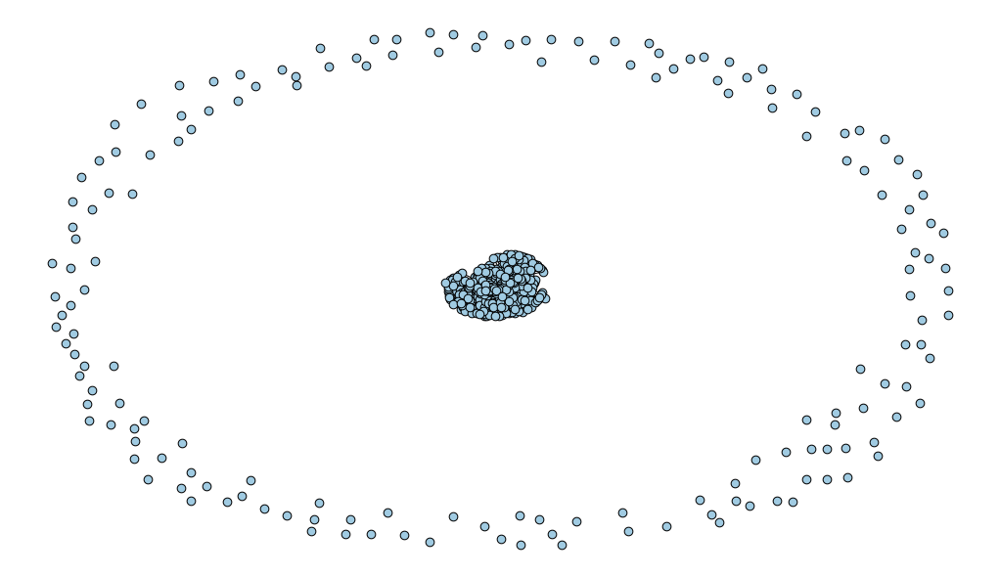

In [78]:
# Draw simple graph
plt.figure(figsize = (14,8))
nx.draw_spring(
    G = B, 
    node_size = 75, 
    node_color = '#A0CBE2', 
    node_shape = 'o',
    edge_color = 'k',
    with_labels = False, 
    edgecolors='k') 
plt.savefig('../figures/bipartiate_graph_init.png', bbox_inches = 'tight', pad_inches = 0)
plt.draw()

From the visualization it can be seen that in the periphery are the politicians that have not retweeted any media. Thus, the interesting part of the graph is the giant connected component and the remaining nodes will be ignored.

In order to create a bipartite graph for the giant connected component, we must ensure that it is connected. 

In [66]:
# Extract GCC
con_comp = sorted(nx.connected_components(B), key = len, reverse = True)
B_GCC = B.subgraph(con_comp[0]).copy()

# Very connectivity
nx.is_connected(B_GCC)

True

Since the GCC is connected, we can create the two sets for the bipartite graph. For every node we can extract information about their type - i.e. does the node belong to the type 'Media' or does it belong to 'Senator', 'Representative' and 'POTUS'. If the node represents a politician it will get the attribute `bipartite` with the value 0. The same is done for the nodes that represent a media - the value for attribute `bipartite` is set to 1. 

In [67]:
# Create two sets for the bipartite graph
for node in B_GCC.nodes:
    
    node_info = Data_Full[Data_Full['Name'] == node]

    # If politician
    if node_info['Type'].values[0] != 'Media':
        B_GCC.nodes[node].update({
            bipartite: 0
        })
        
    # If media
    elif  node_info['Type'].values[0] == 'Media':
         B_GCC.nodes[node].update({
            bipartite: 1
         })

The two sets 'Politicians' and 'Media' are then defined. 

In [68]:
# Get node sets 
B_GCC_politicians = [node for node, value in B_GCC.nodes(data=bipartite) if value == 0]
B_GCC_medias = [node for node, value in B_GCC.nodes(data=bipartite) if value == 1]

The positions of the nodes for both sets are determined using `networkX` build-in function for drawing bipartite graphs. The function outputs the name of the node with the corresponding $x-$ and $y-$coordinates. For better interpretation, the positions of the politicians are sorted after party - 'Republican', 'Libertarian', 'Independent' and 'Democrat'. This is done by sorting the nodes after party and by saving the $y-$coordinate for each politician we can modify the coordinates according to their 'party-position'. The new positions for the politicians are merged with the positions for the media in order to draw the correct edges when drawing the bipartite graph. 

In [69]:
# Determine positions on graph for politicans and medias respectively
positions_init = nx.drawing.layout.bipartite_layout(B_GCC, B_GCC_politicians)
position_pol = {node: pos for node, pos in positions_init.items() if node in B_GCC_politicians}
position_media = {node: pos for node, pos in positions_init.items() if node in B_GCC_medias}

# Save y-coordinates for postion of politicians
y_list = np.linspace(min([v[1] for k,v in position_pol.items()]), max([v[1] for k,v in position_pol.items()]), len(position_pol))

# Get politician list
list_of_politican = [list(Data_Full[Data_Full['Party'] == party]['Name']) for party in ['Republican','Libertarian','Independent','Democrat']]

# Sort politicians after party
ordered_politicians = []
for sublist in list_of_politican:
    for item in sublist:
        ordered_politicians.append(item)

# We only want to use the politicians contained in the GCC
politician_GCC = [politician for politician in ordered_politicians if politician in list(B_GCC.nodes)]

# New positions for politicians
new_positions_politicians = pd.DataFrame(list(zip(politician_GCC, [v[0] for k,v in position_pol.items()], y_list)), 
               columns =['Name', 'x', 'y'])
new_pos_pol_dict = new_positions_politicians.set_index('Name').T.to_dict('list')

# Save all positions
new_positions = {**new_pos_pol_dict, **position_media}

Another important feature for the graph is the color of the nodes. The same colors used in the 'Who-Follows-Whom' graph are used. Furthermore the media nodes are colored based the fraction of democratic links. A custom color scale will be defined going from red to blue over purple as the fraction goes from 0 to 1. Here we *ignore* the very few Liberatarian and Independents in this color scale and as such we do make an assumption that they are Republican in regards to the coloring as we only look at the Democratic factor. As there are so few nodes of Liberatarian and Independents it is seemed as insignificant compared to the fact that the variable node coloring is quite cool.

In [70]:
color_dict_party = {"Democrat": "#0015BC", "Republican": "#DE0100", 'Independent': "tab:gray", 'Libertarian': "#FED105"}
node_colors = [color_dict_party[Data_Full.loc[Data_Full.Name == key, 'Party'].values[0]]
                for key, value in new_pos_pol_dict.items() if Data_Full.loc[Data_Full.Name == key, 'Party'].values[0] is not None]

In [71]:
# Media color
media_count = {media: {'Republican' : 0, 'Democrat' : 0, 'Independent' : 0 , 'Libertarian' : 0}  for media in medias.Name}
politian_party = {politican:party for politican, party in zip(Data_Full.Name, Data_Full.Party)}

for edge, count in nx.get_edge_attributes(B_GCC,'weight').items():
    politicans, media = edge
    
    party = politian_party[politicans]
    media_count[media][party] += count


Democrat_frac_dict = {nm: weights['Democrat']/sum(weights.values()) for nm,weights in media_count.items()}

# Color dict values
cdict = {'red':   ((0.0, 1.0, 1.0), 
                   (0.1, 1.0, 1.0),  # red 
                   (0.4, 1.0, 1.0),  # violet
                   (1.0, 0.0, 0.0)), # blue

         'green': ((0.0, 0.0, 0.0),
                   (1.0, 0.0, 0.0)),

         'blue':  ((0.0, 0.0, 0.0),
                   (0.1, 0.0, 0.0),  # red
                   (0.4, 1.0, 1.0),  # violet
                   (1.0, 1.0, 0.0))  # blue
          }

# Function for color map
def make_colormap(seq):
    seq = [(None,) * 3, 0.0] + list(seq) + [1.0, (None,) * 3]
    cdict = {'red': [], 'green': [], 'blue': []}
    for i, item in enumerate(seq):
        if isinstance(item, float):
            r1, g1, b1 = seq[i - 1]
            r2, g2, b2 = seq[i + 1]
            cdict['red'].append([item, r1, r2])
            cdict['green'].append([item, g1, g2])
            cdict['blue'].append([item, b1, b2])
    return mcolors.LinearSegmentedColormap('CustomMap', cdict)

# Make colormap
c = mcolors.ColorConverter().to_rgb
rvb = make_colormap(
    [c('red'), c('violet'), 0.44, c('violet'), c('blue'), 1, c('blue')])

The bipartite graph is drawn such that the nodes from the two sets, Politicians and Media, are created firstly with the correct positions and colors. Thereafter, the links are added where the width is determined by $\frac{1}{10} \cdot w$, where $w$ is the weight from the adjacency matrix. We have made some experiment to find the scaling factor to make the plot looks good.

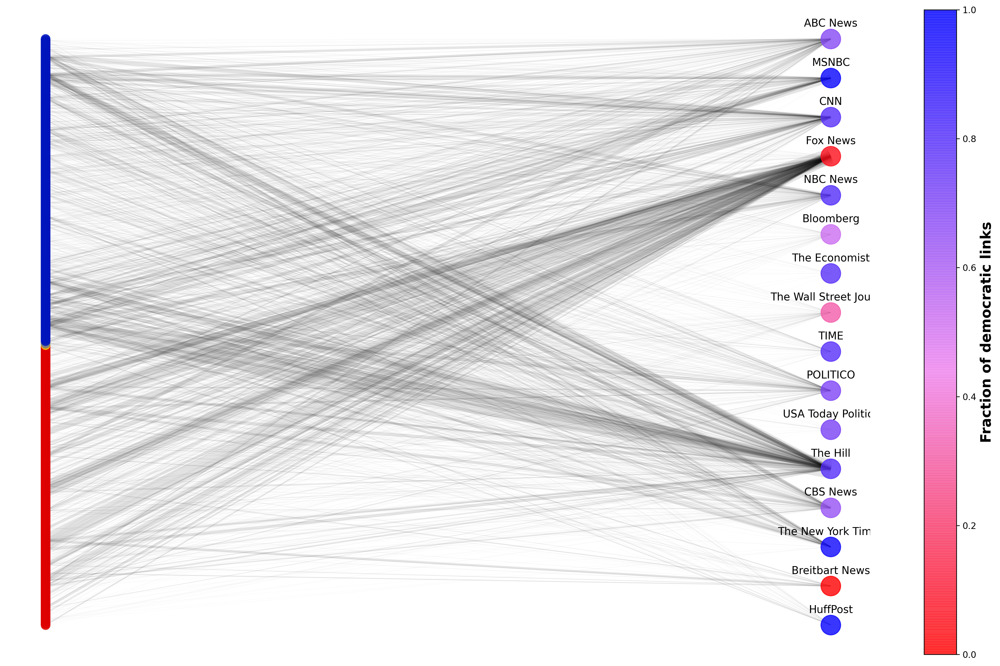

In [79]:
plt.figure(figsize=(22,13.5), dpi = 240)

# Media nodes
nodes_media = nx.draw_networkx_nodes(B_GCC, position_media,
                       nodelist=position_media.keys(),
                       node_color=[Democrat_frac_dict[nm] for nm in position_media.keys()],
                       cmap = rvb,
                       node_size=500,
                   alpha=0.8)

# Politician nodes
nodes_pol = nx.draw_networkx_nodes(B_GCC, new_pos_pol_dict,
                       nodelist=new_pos_pol_dict.keys(),
                       node_color= node_colors,
                       node_size=100,
                   alpha=0.8)

# Edges
edges = nx.draw_networkx_edges(
    G = B_GCC,
    pos = new_positions,
    edgelist = B_GCC.edges(),
    width = [i/10 for i in list(nx.get_edge_attributes(B_GCC,'weight').values())],
    alpha=0.1
)

# Position of labels on media
pos_higher = {}
for k, v in position_media.items():
        pos_higher[k] = (v[0], v[1]+0.02)

labels={key: key for key, value in position_media.items()}
nx.draw_networkx_labels(B_GCC, pos_higher, labels)
#nx.draw_networkx_labels(B_GCC, position_media, labels)
plt.colorbar(nodes_media).set_label(label='Fraction of democratic links',size=16,weight='bold')
nodes_media.set_clim(0, 1)
plt.axis('off')
plt.savefig('../figures/bipartiate_graph.png', bbox_inches = 'tight', pad_inches = 0)
plt.show()

From data, it is known that the majority of the politicians belong to either Republicans or Democrats which is also clearly seen in the set to the left. The bipartite graph shows that Fox News is primarily retweeted by Republican Party politicians and from the width of the links it can be seen that these politicians retweeted Fox News several times. Breitbart News is also retweeted mostly by Republicans however, there are fewer links between the politicians to Breitbart News. 

The Hill and CNN are predominantly blue based on the retweets. Both have probably been retweeted by republicans but as seen on the color scale it is the Democrats who make up the majority of the retweets. Cf. the clip from YouTube presented in Project Assignment A, it is interesting that the CNN node is not colored all blue. An explanation could be that CNN is not as politically polarized as, for example, Fox News is. 

Overall, the bipartite graph clearly shows that the media form part of the political polarization which supports our overall problem. 

## Statistics on the Bipartite Graph

With the bipartite graph it is interesting to investigate statistics such as the distribution of links to each media and also if there exist a so-called butterfly pattern in the graph. I.e. is there a tendency for politicians from the same party to retweet the same media. Another interesting analysis is of the existence of clustering of the media by a clustering coefficient. 


For the investigation of the link distribution for each media, a grouped barplot is created such that the four parties are illustrated as fours bars for each of the media with the corresponding count of retweets. 


In [73]:
# Create four lists for bars in grouped barplot
Republican = [media_count[media]['Republican'] for media, count in media_count.items()]
Libertarian = [media_count[media]['Libertarian'] for media, count in media_count.items()]
Independent = [media_count[media]['Independent'] for media, count in media_count.items()]
Democrat = [media_count[media]['Democrat'] for media, count in media_count.items()]

In [74]:
fig = go.Figure(data=[
    go.Bar(name='Republicans', x=medias['Name'], y=Republican, text=Republican, marker_color='#DE0100', width=0.5),
    go.Bar(name='Independents', x=medias['Name'], y=Independent, text=Independent, marker_color='#7f7f7f', width=0.5),
    go.Bar(name='Libertarians', x=medias['Name'], y=Libertarian, text=Libertarian, marker_color='#FED105', width=0.5),
    go.Bar(name='Democrats', x=medias['Name'], y=Democrat, text=Democrat, marker_color='#0015BC', width=0.5)
])

fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(barmode='stack',margin=dict(b=5,l=5,r=5,t=40),
    titlefont_size=16, uniformtext_minsize=8, autosize=False,
    width=1000, height=500, bargap=0.2, bargroupgap=0.2)
# save for website
fig.write_html(
    file = "../web_app/plotly_files/Bipartite_grouped_barplot.html", 
    full_html = False,
    include_plotlyjs='cdn'
)
fig.show()

The media that are retweeted the most are CNN, Fox News, MSNBC, The New York Times, and The Hill where in particular The Hill and Fox News have been retweeted a lot during the given period. The figure shows some quite interesting - namely that the majority of the politicians that have retweeted The Hill are democrats. It also shows that Fox News has been retweeted by republicans, as expected. 


A built-in function in the `bipartite` subpackage of `networkX` is the Robins-Alexander bipartite clustering coefficient. This coefficient calculates the probability that a bipartite caterpillar participates in a bipartite butterfly. This can be translated to the probability that politicians from the same party retweet the same media. 

The coefficent is given by $$c = \frac{4\times n^{\bowtie}}{n^{\mathsf{z}}} =\frac{4 \times (\text{total number of butterflies})}{\text{total number of caterpillars}}.$$ 

The factor of 4 comes from the fact that there are four caterpillars in a butterfly.
(ref. to https://arxiv.org/pdf/1607.08673.pdf)

In [75]:
# Calculate coefficient
bipartite.robins_alexander_clustering(B_GCC)

0.44215420474544737

From the coefficient, it can be interpreted that 44\% of the caterpillars become butterflies in our bipartite graph. As we only have one graph it is hard to put this number in comparison but it looks like there could be a tendency for politicians from the same party to retweet the same media.

Another clustering method in the `bipartite` package is the bipartite clustering coefficient that measures the degree to which nodes in a graph tend to cluster together. It is defined $$c_u = \frac{\sum_{v \in N(N(u))} \ c_{uv}}{|N(N(u))|}$$ (ref. til https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.bipartite.cluster.clustering.html). 

The clustering coefficient is calculated for all the 16 media

In [76]:
bipartite.clustering(B_GCC, nodes = medias['Name'])

{'ABC News': 0.23316120974611892,
 'CBS News': 0.23728258674830546,
 'CNN': 0.2513900362185082,
 'Fox News': 0.13822842455820414,
 'MSNBC': 0.22483328217724538,
 'NBC News': 0.22700679748126662,
 'Bloomberg': 0.13443336361389543,
 'The New York Times': 0.22280465199578978,
 'USA Today Politics': 0.05825873525719665,
 'Breitbart News': 0.06798366736573926,
 'TIME': 0.1422312019180924,
 'The Hill': 0.2499994123986379,
 'POLITICO': 0.24018246218069988,
 'The Wall Street Journal': 0.13685496067261213,
 'The Economist': 0.05979576337633215,
 'HuffPost': 0.12262269455134579}

Here a large variety of numbers are seen. Some of the classic large American news media scores high here which fits well with formula - they are way more *connected*.

# Sub conclusion
In this notebook, we have looked at how the politicians retweet each other and how they retweet the media.
The retweet between the politicians highlighted that some are very fond of re-tweeting themselves, however, this has been corrected. 
Both the in and out-degree distribution resembles that of a scale-free network and particular the in-degree highlight the "popular/important" politicians in the dataset. 
Modeling the retweets as a graph much resembles the *who-follow-whom* the most important distinguishing fact between the two graphs is that Donald J. Trump becomes the center of the Republican party rather in the retweet graph.
Furthermore, it was found that politicians tend to retweet politicians from the same party.
This aligns with our hypothesis that politicians tend to retweet people that they like - assuming they are more fond of people from their own party. 


The bipartite graph is used to investigate the media's contribution to political polarization if they have any. By dividing a simple graph containing all nodes into two sets - one for media, one for politicians - it can be concluded that based on retweets, the media have a part in the political polarization.  
In the bipartite analysis, it was found that politicians from the same party tend to retweet the same media. Particular are the republican Politicians found of retweeting Fox News whereas the Democratic Politicians are found of The Hill and MSNBC. 
Furthermore, the Robins-Alexander bipartite clustering coefficient was calculated on the graph to measure the tendency for politicians from the same party to retweet the same media. 
Here it was found there is a tendency for politicians from the same party to retweet the same media.